# Install detectron2

In [1]:
# !python -m pip install pyyaml==5.1
# import sys, os, distutils.core
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# !git clone 'https://github.com/facebookresearch/detectron2'
# dist = distutils.core.run_setup("setup.py")
# !python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# sys.path.insert(0, os.path.abspath('./detectron2'))
# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [2]:
import torch, detectron2
!nvidia-smi
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

Tue Jul 18 17:08:52 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.54.03              Driver Version: 535.54.03    CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1080 Ti     Off | 00000000:02:00.0  On |                  N/A |
|  0%   40C    P8              27W / 320W |  10992MiB / 11264MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt

#import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

The dataset should be in coco format.

## Prepare the dataset

In [4]:
from detectron2.data.datasets import register_coco_instances
trn_json = "/home/wjdgy/Desktop/SAM-OOD-Detection/VOS_DATASET_ROOT/voc0712_train_all.json"
val_json = "/home/wjdgy/Desktop/SAM-OOD-Detection/VOS_DATASET_ROOT/val_coco_format.json"
img_dir = "/home/wjdgy/Desktop/SAM-OOD-Detection/VOS_DATASET_ROOT/JPEGImages"
register_coco_instances("train_dataset", {}, trn_json, img_dir)
register_coco_instances("val_dataset", {}, val_json, img_dir)

### Visualize ground-truth annotations

In [5]:
from detectron2.utils.visualizer import ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog
vocmeta_data = MetadataCatalog.get("val_dataset")
dataset_dicts = DatasetCatalog.get("val_dataset")

[07/18 17:08:57 d2.data.datasets.coco]: Loaded 4952 images in COCO format from /home/wjdgy/Desktop/SAM-OOD-Detection/VOS_DATASET_ROOT/val_coco_format.json


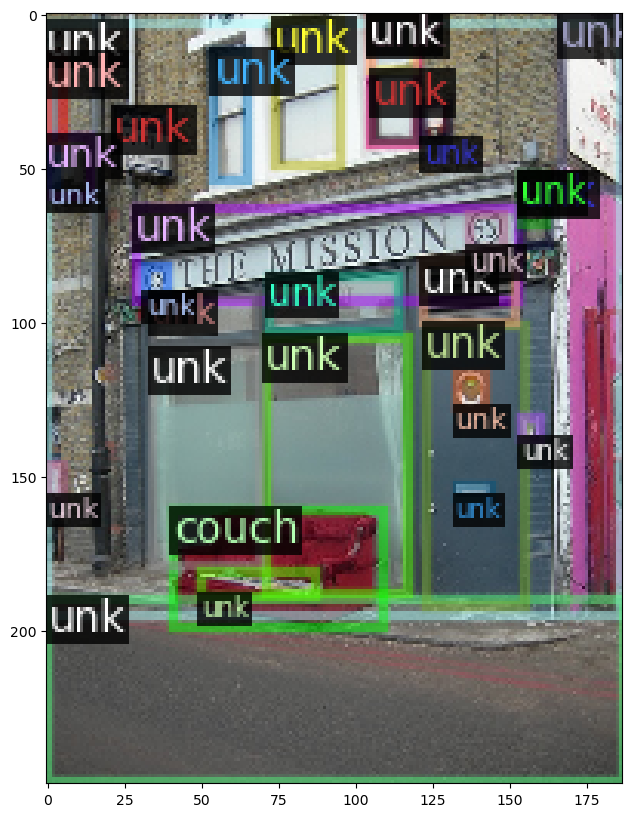

In [6]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=vocmeta_data, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    plt.imshow(out.get_image())
    plt.gcf().set_size_inches(10, 10)

## Train!

Now, let's train a R50-FPN Faster R-CNN model on the Pascal VOC dataset from scratch.


In [7]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer

In [8]:
from detectron2.modeling.roi_heads import StandardROIHeads, ROI_HEADS_REGISTRY
from detectron2.modeling.roi_heads.custom_fast_rcnn import CustomRCNNOutput

@ROI_HEADS_REGISTRY.register()
class CustomROIHeads(StandardROIHeads):
  def __init__(self, *args, **kwargs):
    super().__init__(*args, **kwargs)


    @classmethod
    def _init_box_head(cls, cfg, input_shape):
        # fmt: off
        in_features       = cfg.MODEL.ROI_HEADS.IN_FEATURES
        pooler_resolution = cfg.MODEL.ROI_BOX_HEAD.POOLER_RESOLUTION
        pooler_scales     = tuple(1.0 / input_shape[k].stride for k in in_features)
        sampling_ratio    = cfg.MODEL.ROI_BOX_HEAD.POOLER_SAMPLING_RATIO
        pooler_type       = cfg.MODEL.ROI_BOX_HEAD.POOLER_TYPE
        # fmt: on

        # If StandardROIHeads is applied on multiple feature maps (as in FPN),
        # then we share the same predictors and therefore the channel counts must be the same
        in_channels = [input_shape[f].channels for f in in_features]
        # Check all channel counts are equal
        assert len(set(in_channels)) == 1, in_channels
        in_channels = in_channels[0]

        box_pooler = ROIPooler(
            output_size=pooler_resolution,
            scales=pooler_scales,
            sampling_ratio=sampling_ratio,
            pooler_type=pooler_type,
        )
        # Here we split "box head" and "box predictor", which is mainly due to historical reasons.
        # They are used together so the "box predictor" layers should be part of the "box head".
        # New subclasses of ROIHeads do not need "box predictor"s.
        box_head = build_box_head(
            cfg, ShapeSpec(channels=in_channels, height=pooler_resolution, width=pooler_resolution)
        )
        box_predictor = CustomRCNNOutput(cfg, box_head.output_shape)
        return {
            "box_in_features": in_features,
            "box_pooler": box_pooler,
            "box_head": box_head,
            "box_predictor": box_predictor,
        }



In [11]:
cfg = get_cfg()
cfg.merge_from_file("configs/PascalVOC-Detection/custom.yaml")
cfg.DATASETS.TRAIN = ("train_dataset",)
cfg.DATASETS.VAL = ("val_dataset",)
cfg.DATASETS.TEST = ()
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20 + 1  #  (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# 20 known classes + 1 unknown class

#os.makedirs(cfg.OUTPUT_DIR)
#trainer = DefaultTrainer(cfg)
#trainer.resume_or_load(resume=False)
#trainer.train()

In [14]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the validation dataset. First, let's create a predictor using the model we just trained:



In [13]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[07/18 17:11:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ckpt/PascalVOC-OOD-Detection/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

[07/18 17:11:30 d2.data.datasets.coco]: Loaded 4952 images in COCO format from /home/wjdgy/Desktop/SAM-OOD-Detection/VOS_DATASET_ROOT/val_coco_format.json


/home/wjdgy/anaconda3/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


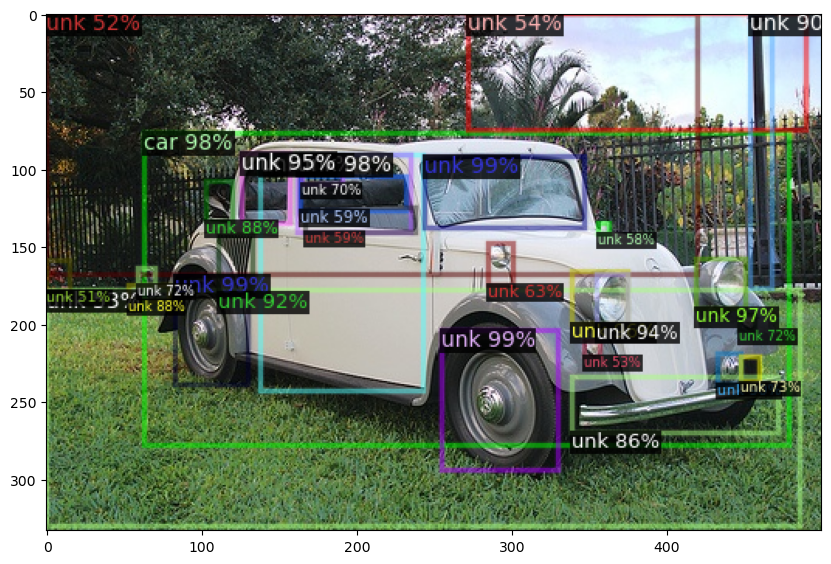

In [14]:
from detectron2.utils.visualizer import ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog
vocmeta_data = MetadataCatalog.get("val_dataset")
dataset_dicts = DatasetCatalog.get("val_dataset")

for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=vocmeta_data,
                   scale=1
    )
    output_image = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(output_image.get_image())
    plt.gcf().set_size_inches(10, 10)

We can also evaluate its performance using AP metric implemented in COCO API.

# Evaluate mAP of the known class

Note: the `unknown` class should be excluded from the evaluation.

In [15]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

class ExcludeClassCOCOEvaluator(COCOEvaluator):
    def __init__(self, dataset_name, output_dir, excluded_class_id):
        super().__init__(dataset_name, output_dir)
        self.excluded_class_id = excluded_class_id

    def evaluate(self):
        # Filter out annotations and predictions for the excluded class
        filtered_annotations = [
            ann for ann in self._predictions["annotations"]
            if ann["category_id"] != self.excluded_class_id
        ]
        
        filtered_predictions = [
            pred for pred in self._predictions["instances"]
            if pred.pred_classes != self.excluded_class_id
        ]

        # Update the evaluator's predictions with filtered annotations and predictions
        self._predictions["annotations"] = filtered_annotations
        self._predictions["instances"] = filtered_predictions

        # Perform the default evaluation
        super().evaluate()

In [16]:
evaluator = COCOEvaluator("val_dataset", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val_dataset")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[07/18 17:11:37 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[07/18 17:11:39 d2.data.datasets.coco]: Loaded 4952 images in COCO format from /home/wjdgy/Desktop/SAM-OOD-Detection/VOS_DATASET_ROOT/val_coco_format.json
[07/18 17:11:39 d2.data.build]: Distribution of instances among all 21 categories:
|  category  | #instances   |   category   | #instances   |   category   | #instances   |
|:----------:|:-------------|:------------:|:-------------|:------------:|:-------------|
|   person   | 5227         |     bird     | 576          |     cat      | 370          |
|    cow     | 329          |     dog      | 530          |    horse     | 395          |
|   sheep    | 311          |   airplane   | 311          |   bicycle    | 389          |
|    boat    | 393          |     bus      | 254          |     car      | 1541         |
| motorcycle | 369          |    train     | 302          |    bottle    | 657          |
|   chair    | 1374

[07/18 17:14:33 d2.evaluation.evaluator]: Inference done 1688/4952. Dataloading: 0.0012 s/iter. Inference: 0.1010 s/iter. Eval: 0.0002 s/iter. Total: 0.1025 s/iter. ETA=0:05:34
[07/18 17:14:38 d2.evaluation.evaluator]: Inference done 1737/4952. Dataloading: 0.0012 s/iter. Inference: 0.1010 s/iter. Eval: 0.0002 s/iter. Total: 0.1025 s/iter. ETA=0:05:29
[07/18 17:14:43 d2.evaluation.evaluator]: Inference done 1787/4952. Dataloading: 0.0012 s/iter. Inference: 0.1010 s/iter. Eval: 0.0002 s/iter. Total: 0.1025 s/iter. ETA=0:05:24
[07/18 17:14:48 d2.evaluation.evaluator]: Inference done 1837/4952. Dataloading: 0.0012 s/iter. Inference: 0.1009 s/iter. Eval: 0.0002 s/iter. Total: 0.1024 s/iter. ETA=0:05:18
[07/18 17:14:53 d2.evaluation.evaluator]: Inference done 1886/4952. Dataloading: 0.0012 s/iter. Inference: 0.1009 s/iter. Eval: 0.0002 s/iter. Total: 0.1024 s/iter. ETA=0:05:13
[07/18 17:14:58 d2.evaluation.evaluator]: Inference done 1934/4952. Dataloading: 0.0012 s/iter. Inference: 0.1010 s

[07/18 17:18:20 d2.evaluation.evaluator]: Inference done 3882/4952. Dataloading: 0.0012 s/iter. Inference: 0.1015 s/iter. Eval: 0.0002 s/iter. Total: 0.1030 s/iter. ETA=0:01:50
[07/18 17:18:25 d2.evaluation.evaluator]: Inference done 3931/4952. Dataloading: 0.0012 s/iter. Inference: 0.1015 s/iter. Eval: 0.0002 s/iter. Total: 0.1030 s/iter. ETA=0:01:45
[07/18 17:18:30 d2.evaluation.evaluator]: Inference done 3980/4952. Dataloading: 0.0012 s/iter. Inference: 0.1015 s/iter. Eval: 0.0002 s/iter. Total: 0.1030 s/iter. ETA=0:01:40
[07/18 17:18:35 d2.evaluation.evaluator]: Inference done 4030/4952. Dataloading: 0.0012 s/iter. Inference: 0.1015 s/iter. Eval: 0.0002 s/iter. Total: 0.1030 s/iter. ETA=0:01:34
[07/18 17:18:40 d2.evaluation.evaluator]: Inference done 4080/4952. Dataloading: 0.0012 s/iter. Inference: 0.1015 s/iter. Eval: 0.0002 s/iter. Total: 0.1030 s/iter. ETA=0:01:29
[07/18 17:18:45 d2.evaluation.evaluator]: Inference done 4126/4952. Dataloading: 0.0012 s/iter. Inference: 0.1016 s

# Evaluate Out-of-Distribution Detection

We evaluate out-of-distribution detection on COCO dataset (non-overlapping with Pascal dataset).

## Load OOD Dataset (COCO)

In [17]:
coco_dataset = "OOD_Dataset/instances_val2017_ood_rm_overlap.json"
img_dir = "OOD_Dataset/val2017"
register_coco_instances("coco_val2017", {}, coco_dataset, img_dir)

In [18]:
voc_name_mapping = {
    0: 'person',
    1: 'bird',
    2: 'cat',
    3: 'cow',
    4: 'dog',
    5: 'horse',
    6: 'sheep',
    7: 'airplane',
    8: 'bicycle',
    9: 'boat',
    10: 'bus',
    11: 'car',
    12: 'motorcycle',
    13: 'train',
    14: 'bottle',
    15: 'chair',
    16: 'dining table',
    17: 'potted plant',
    18: 'couch',
    19: 'tv',
    20: 'unk'
}

In [19]:
import matplotlib.patches as patches

[07/18 17:36:59 d2.data.datasets.coco]: Loaded 930 images in COCO format from OOD_Dataset/instances_val2017_ood_rm_overlap.json


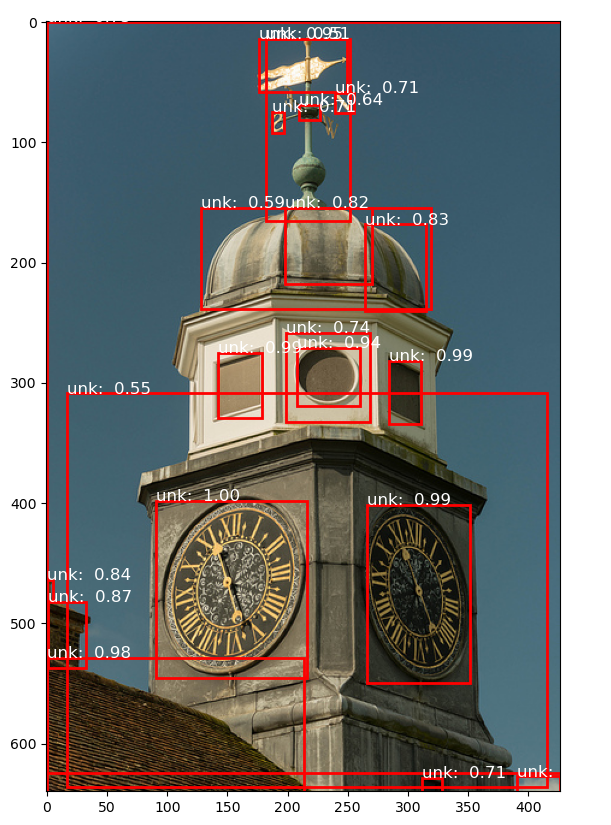

In [20]:
cocometa_data = MetadataCatalog.get("coco_val2017")
dataset_dicts = DatasetCatalog.get("coco_val2017")
fig, ax = plt.subplots()
for d in random.sample(dataset_dicts, 1):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    pred_classes = outputs["instances"].pred_classes.cpu().numpy()
    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    scores = outputs["instances"].scores.cpu().numpy()
    ax.imshow(im[:, :, ::-1])
    for box, cls, score in zip(pred_boxes, pred_classes, scores):
        color = 'r' if cls == 20 else 'g'
        rec = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], edgecolor=color, facecolor="none", linewidth=2)
        ax.add_patch(rec)
        name = voc_name_mapping[cls]
        ax.text(box[0], box[1], f'{name}: {score: .2f}', fontsize=12, color="white")
    plt.gcf().set_size_inches(10, 10)

In [25]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

#Register the COCO dataset
coco_dataset = "instances_val2017_ood_rm_overlap.json"
img_dir = "val2017"
#register_coco_instances("coco_val2017", {}, coco_dataset, img_dir)

#Setup the logger
setup_logger()

#Create a config object
cfg = get_cfg()
cfg.merge_from_file("configs/PascalVOC-Detection/custom.yaml") # Path to your config file

#Set the model and dataset configurations
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Set the testing threshold
cfg.DATASETS.TEST = ("coco_val2017",) # Use the COCO dataset for testing

#Create the predictor
predictor = DefaultPredictor(cfg)

#Build the test data loader|
data_loader = build_detection_test_loader(cfg, "coco_val2017")

evaluator = COCOEvaluator("coco_val2017", cfg, False, output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val_dataset")
#inference_on_dataset(trainer.model, val_loader, evaluator)
inference_on_dataset(predictor.model, data_loader, evaluator)

[07/18 17:43:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ckpt/PascalVOC-OOD-Detection/model_final.pth ...
[07/18 17:43:27 d2.data.datasets.coco]: Loaded 930 images in COCO format from OOD_Dataset/instances_val2017_ood_rm_overlap.json
[07/18 17:43:27 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/18 17:43:27 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/18 17:43:27 d2.data.common]: Serializing 930 elements to byte tensors and concatenating them all ...
[07/18 17:43:27 d2.data.common]: Serialized dataset takes 1.58 MiB
[07/18 17:43:27 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/18 17:43:27 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit 

OrderedDict([('bbox', {'AP': 9.639728882385076e-05, 'AP50': 0.0002304118127887264, 'AP75': 5.991479760673371e-05, 'APs': 9.486033199285937e-05, 'APm': 0.00018161354403355994, 'APl': 0.0001719052859965565, 'AP-person': nan, 'AP-bicycle': nan, 'AP-car': nan, 'AP-motorcycle': nan, 'AP-airplane': nan, 'AP-bus': nan, 'AP-train': nan, 'AP-truck': 0.0, 'AP-boat': nan, 'AP-traffic light': 0.0, 'AP-fire hydrant': 0.0, 'AP-stop sign': 0.0, 'AP-parking meter': 0.0, 'AP-bench': 0.0, 'AP-bird': nan, 'AP-cat': nan, 'AP-dog': nan, 'AP-horse': nan, 'AP-sheep': nan, 'AP-cow': nan, 'AP-elephant': 0.005591042751783344, 'AP-bear': 0.0, 'AP-zebra': 0.0, 'AP-giraffe': 0.0, 'AP-backpack': 0.0, 'AP-umbrella': 0.0, 'AP-handbag': 0.0, 'AP-tie': 0.0, 'AP-suitcase': 0.0, 'AP-frisbee': 0.0, 'AP-skis': nan, 'AP-snowboard': 0.0, 'AP-sports ball': 0.0, 'AP-kite': 0.0, 'AP-baseball bat': nan, 'AP-baseball glove': 0.0, 'AP-skateboard': 0.0, 'AP-surfboard': 0.0, 'AP-tennis racket': 0.0, 'AP-bottle': nan, 'AP-wine glass'

In [29]:
print(evaluator._results)


OrderedDict([('bbox', {'AP': 9.639728882385076e-05, 'AP50': 0.0002304118127887264, 'AP75': 5.991479760673371e-05, 'APs': 9.486033199285937e-05, 'APm': 0.00018161354403355994, 'APl': 0.0001719052859965565, 'AP-person': nan, 'AP-bicycle': nan, 'AP-car': nan, 'AP-motorcycle': nan, 'AP-airplane': nan, 'AP-bus': nan, 'AP-train': nan, 'AP-truck': 0.0, 'AP-boat': nan, 'AP-traffic light': 0.0, 'AP-fire hydrant': 0.0, 'AP-stop sign': 0.0, 'AP-parking meter': 0.0, 'AP-bench': 0.0, 'AP-bird': nan, 'AP-cat': nan, 'AP-dog': nan, 'AP-horse': nan, 'AP-sheep': nan, 'AP-cow': nan, 'AP-elephant': 0.005591042751783344, 'AP-bear': 0.0, 'AP-zebra': 0.0, 'AP-giraffe': 0.0, 'AP-backpack': 0.0, 'AP-umbrella': 0.0, 'AP-handbag': 0.0, 'AP-tie': 0.0, 'AP-suitcase': 0.0, 'AP-frisbee': 0.0, 'AP-skis': nan, 'AP-snowboard': 0.0, 'AP-sports ball': 0.0, 'AP-kite': 0.0, 'AP-baseball bat': nan, 'AP-baseball glove': 0.0, 'AP-skateboard': 0.0, 'AP-surfboard': 0.0, 'AP-tennis racket': 0.0, 'AP-bottle': nan, 'AP-wine glass'

In [22]:
import matplotlib.patches as patches

[07/18 18:17:59 d2.data.datasets.coco]: Loaded 930 images in COCO format from OOD_Dataset/instances_val2017_ood_rm_overlap.json


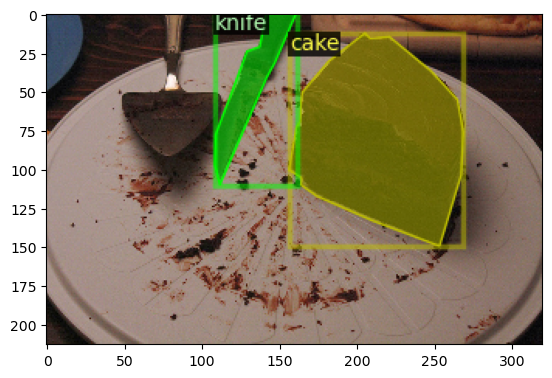

In [44]:
vocmeta_data = MetadataCatalog.get("coco_val2017")
dataset_dicts = DatasetCatalog.get("coco_val2017")
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=vocmeta_data, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    plt.imshow(out.get_image())
    # plt.gcf().set_size_inches(10, 10)

[07/18 18:00:13 d2.data.datasets.coco]: Loaded 930 images in COCO format from OOD_Dataset/instances_val2017_ood_rm_overlap.json


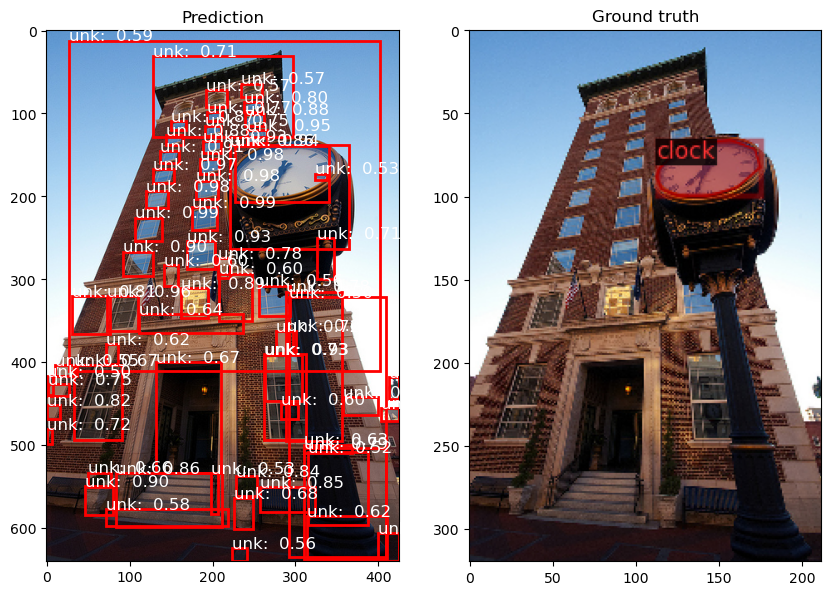

In [42]:
cocometa_data = MetadataCatalog.get("coco_val2017")
dataset_dicts = DatasetCatalog.get("coco_val2017")
fig, axes = plt.subplots(1,2)
for d in random.sample(dataset_dicts, 1):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    pred_classes = outputs["instances"].pred_classes.cpu().numpy()
    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    scores = outputs["instances"].scores.cpu().numpy()
    axes[0].imshow(im[:, :, ::-1])
    for box, cls, score in zip(pred_boxes, pred_classes, scores):
        # if cls == 20:
        #     continue
        color = 'r' if cls == 20 else 'g'
        rec = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], edgecolor=color, facecolor="none", linewidth=2)
        axes[0].add_patch(rec)
        name = voc_name_mapping[cls]
        axes[0].text(box[0], box[1], f'{name}: {score: .2f}', fontsize=12, color="white")
    axes[0].set_title("Prediction")
    # visualize ground truth
    visualizer = Visualizer(im[:, :, ::-1], metadata=vocmeta_data, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    axes[1].imshow(out.get_image())
    axes[1].set_title("Ground truth")    
    plt.gcf().set_size_inches(10, 10)